# 查找并且处理异常图片

## 定义训练集目录

In [1]:
import os, shutil, platform
import numpy as np
import pandas as pd

In [6]:
train_folder = "train"
train_filenames = os.listdir(train_folder)
bad_image_names = set()
top = 50

def append_to_bad_file_names_if_need(preds, file_name,top):
    append = True
    for i in range(0, top):
        type_code = preds[i][0]
        if is_car_or_dog_image(type_code):
            append = False
    if append:
        bad_image_names.add(file_name)

## 定义`Imagenet`数据集中的猫狗类型

In [7]:
imagenet_dog_types = [
 'n02085620','n02085782','n02085936','n02086079'
,'n02086240','n02086646','n02086910','n02087046'
,'n02087394','n02088094','n02088238','n02088364'
,'n02088466','n02088632','n02089078','n02089867'
,'n02089973','n02090379','n02090622','n02090721'
,'n02091032','n02091134','n02091244','n02091467'
,'n02091635','n02091831','n02092002','n02092339'
,'n02093256','n02093428','n02093647','n02093754'
,'n02093859','n02093991','n02094114','n02094258'
,'n02094433','n02095314','n02095570','n02095889'
,'n02096051','n02096177','n02096294','n02096437'
,'n02096585','n02097047','n02097130','n02097209'
,'n02097298','n02097474','n02097658','n02098105'
,'n02098286','n02098413','n02099267','n02099429'
,'n02099601','n02099712','n02099849','n02100236'
,'n02100583','n02100735','n02100877','n02101006'
,'n02101388','n02101556','n02102040','n02102177'
,'n02102318','n02102480','n02102973','n02104029'
,'n02104365','n02105056','n02105162','n02105251'
,'n02105412','n02105505','n02105641','n02105855'
,'n02106030','n02106166','n02106382','n02106550'
,'n02106662','n02107142','n02107312','n02107574'
,'n02107683','n02107908','n02108000','n02108089'
,'n02108422','n02108551','n02108915','n02109047'
,'n02109525','n02109961','n02110063','n02110185'
,'n02110341','n02110627','n02110806','n02110958'
,'n02111129','n02111277','n02111500','n02111889'
,'n02112018','n02112137','n02112350','n02112706'
,'n02113023','n02113186','n02113624','n02113712'
,'n02113799','n02113978']

imagenet_cat_types =[
'n02123045','n02123159','n02123394','n02123597'
,'n02124075','n02125311','n02127052']



def is_car_or_dog_image(type_code):
    if type_code in imagenet_dog_types or type_code in imagenet_cat_types:
        return True
    else:
        return False

## `ResNet50`预测非猫非狗

### 建立模型

In [8]:
from keras.preprocessing import image
from keras.applications.resnet50 import ResNet50, preprocess_input, decode_predictions

target_size_resnet = (224, 224)
model_resnet550 = ResNet50(weights='imagenet')

### 预测非猫非狗图片

In [9]:
def prepare_input(file_name):
    path = "train/" + file_name
    img = image.load_img(path, target_size= target_size_resnet)
    x = image.img_to_array(img)
    x = np.expand_dims(x, axis=0)
    x = preprocess_input(x)
    return x 
    

for file_name in train_filenames:
    x = prepare_input(file_name)
    preds = model_resnet550.predict(x)
    pred_results = decode_predictions(preds, top)[0]
    append_to_bad_file_names_if_need(pred_results, file_name,top)
    
print ("ResNet50 工作完毕!!!")

ResNet50 工作完毕!!!


In [10]:
print(len(bad_image_names))

45


## `Xception`预测非猫非狗

### 导入类库

In [11]:
from keras.preprocessing import image
from keras.applications.xception import Xception, preprocess_input, decode_predictions

target_size_xception = (299, 299)
model_xception = Xception(weights='imagenet')

91889664/91884032 [==============================] - 1s 0us/step


### 预测非猫非狗图片

In [12]:
def prepare_input(file_name):
    path = "train/" + file_name
    img = image.load_img(path, target_size= target_size_xception)
    x = image.img_to_array(img)
    x = np.expand_dims(x, axis=0)
    x = preprocess_input(x)
    return x 
    

for file_name in train_filenames:
    x = prepare_input(file_name)
    preds = model_xception.predict(x)
    pred_results = decode_predictions(preds, top)[0]
    append_to_bad_file_names_if_need(pred_results, file_name,top)
    
print ("Xception 工作完毕!!!")

Xception 工作完毕!!!


In [13]:
print(len(bad_image_names))

58


## `InceptionResNetV2`预测非猫非狗

### 导入类库

In [14]:
from keras.preprocessing import image
from keras.applications.inception_resnet_v2 import InceptionResNetV2, preprocess_input, decode_predictions

target_size_irv2 = (299, 299)
model_irv2 = InceptionResNetV2(weights='imagenet')

225214464/225209952 [==============================] - 5s 0us/step


### 预测非猫非狗图片

In [15]:
def prepare_input(file_name):
    path = "train/" + file_name
    img = image.load_img(path, target_size= target_size_irv2)
    x = image.img_to_array(img)
    x = np.expand_dims(x, axis=0)
    x = preprocess_input(x)
    return x 

for file_name in train_filenames:
    x = prepare_input(file_name)
    preds = model_irv2.predict(x)
    pred_results = decode_predictions(preds, top)[0]
    append_to_bad_file_names_if_need(pred_results, file_name,top)
    
print ("InceptionResNetV2 工作完毕!!!")

InceptionResNetV2 工作完毕!!!


In [31]:
bad_image_size = len(bad_image_names)
print(bad_image_size)

64


## 打印可疑图片列表

In [32]:
bad_images_list = list(bad_image_names)
print(bad_images_list)

['cat.12272.jpg', 'dog.1773.jpg', 'cat.10029.jpg', 'cat.3216.jpg', 'cat.5071.jpg', 'dog.6725.jpg', 'cat.7464.jpg', 'dog.1259.jpg', 'dog.8736.jpg', 'dog.1625.jpg', 'dog.11437.jpg', 'dog.10190.jpg', 'cat.10636.jpg', 'cat.5351.jpg', 'cat.8921.jpg', 'dog.1895.jpg', 'dog.11266.jpg', 'cat.2520.jpg', 'cat.8456.jpg', 'cat.5974.jpg', 'cat.3004.jpg', 'dog.12376.jpg', 'cat.4688.jpg', 'dog.4218.jpg', 'cat.10365.jpg', 'cat.9171.jpg', 'dog.10747.jpg', 'cat.2939.jpg', 'dog.5604.jpg', 'cat.11184.jpg', 'dog.7076.jpg', 'dog.6475.jpg', 'cat.12476.jpg', 'dog.9188.jpg', 'dog.11299.jpg', 'dog.2614.jpg', 'dog.10161.jpg', 'cat.4308.jpg', 'dog.4367.jpg', 'dog.8898.jpg', 'cat.5418.jpg', 'cat.3672.jpg', 'cat.11039.jpg', 'cat.7968.jpg', 'cat.12424.jpg', 'dog.10801.jpg', 'cat.7564.jpg', 'dog.1194.jpg', 'dog.2339.jpg', 'cat.8470.jpg', 'cat.4338.jpg', 'cat.6345.jpg', 'cat.9983.jpg', 'cat.1139.jpg', 'dog.7706.jpg', 'cat.10536.jpg', 'dog.10237.jpg', 'cat.7377.jpg', 'dog.9517.jpg', 'cat.6348.jpg', 'dog.3889.jpg', 'cat.

In [1]:
# 把笔记本输出内容复制下来
bad_images_list = [
    'cat.12272.jpg', 'dog.1773.jpg', 'cat.10029.jpg', 'cat.3216.jpg', 
    'cat.5071.jpg', 'dog.6725.jpg', 'cat.7464.jpg', 'dog.1259.jpg', 
    'dog.8736.jpg', 'dog.1625.jpg', 'dog.11437.jpg', 'dog.10190.jpg', 
    'cat.10636.jpg', 'cat.5351.jpg', 'cat.8921.jpg', 'dog.1895.jpg', 
    'dog.11266.jpg', 'cat.2520.jpg', 'cat.8456.jpg', 'cat.5974.jpg', 
    'cat.3004.jpg', 'dog.12376.jpg', 'cat.4688.jpg', 'dog.4218.jpg', 
    'cat.10365.jpg', 'cat.9171.jpg', 'dog.10747.jpg', 'cat.2939.jpg', 
    'dog.5604.jpg', 'cat.11184.jpg', 'dog.7076.jpg', 'dog.6475.jpg', 
    'cat.12476.jpg', 'dog.9188.jpg', 'dog.11299.jpg', 'dog.2614.jpg', 
    'dog.10161.jpg', 'cat.4308.jpg', 'dog.4367.jpg', 'dog.8898.jpg', 
    'cat.5418.jpg', 'cat.3672.jpg', 'cat.11039.jpg', 'cat.7968.jpg', 
    'cat.12424.jpg', 'dog.10801.jpg', 'cat.7564.jpg', 'dog.1194.jpg', 
    'dog.2339.jpg', 'cat.8470.jpg', 'cat.4338.jpg', 'cat.6345.jpg', 
    'cat.9983.jpg', 'cat.1139.jpg', 'dog.7706.jpg', 'cat.10536.jpg', 
    'dog.10237.jpg', 'cat.7377.jpg', 'dog.9517.jpg', 'cat.6348.jpg', 
    'dog.3889.jpg', 'cat.10712.jpg', 'dog.4507.jpg', 'dog.2422.jpg']

## 可视化

In [2]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np

plt.figure(figsize=(256, 256))
for i in range(bad_image_size):
    img_file_name = bad_images_list[i]
    plt.subplot(16, 4, i+1)
    plt.title(img_file_name)
    plt.axis('off')
    img_path = "./train/" + img_file_name
    img_obj = mpimg.imread(img_path)
    plt.imshow(img_obj, interpolation="nearest")
    

NameError: name 'bad_image_size' is not defined

# 人工确认

In [34]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

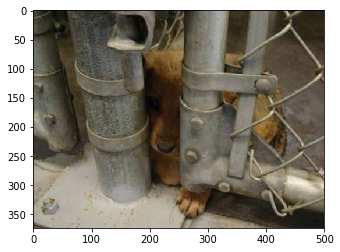

In [105]:
img_path = "./train/" + bad_images_list[63]
img_obj = mpimg.imread(img_path)
plt.imshow(img_obj, interpolation="nearest")

## 异常图片初步分类

In [113]:
# 明显错误，不包含猫狗的图片
wrong_type1_list = [0,1,2,3,8,13,18,21,25,26,28,29,31,34,35,36,38,39,40,45,46,47,50,53,56,57,58,61]
# 包含正常单一猫狗的图片下标
wrong_type2_list = [4,6,9,16,20,23,32,54]
# 包含卡通猫狗或者两者都有的图片下标
wrong_type3_list = [7,11,15,22,27,33,43,49]
# 背景复杂但是包含正常猫狗单一图片的图片下标
wrong_type4_list = [5,10,12,14,17,19,24,30,37,41,42,44,48,51,52,55,59,60,62,63]

## 展示明显错误的图片

In [114]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np

plt.figure(figsize=(256, 256))
length = len(wrong_type1_list)
for i in range(length):
    img_file_name = bad_images_list[wrong_type1_list[i]]
    plt.subplot(16, 4, i+1)
    plt.title(img_file_name)
    plt.axis('off')
    img_path = "./train/" + img_file_name
    img_obj = mpimg.imread(img_path)
    plt.imshow(img_obj, interpolation="nearest")

## 展示包含正常单一猫狗的图片

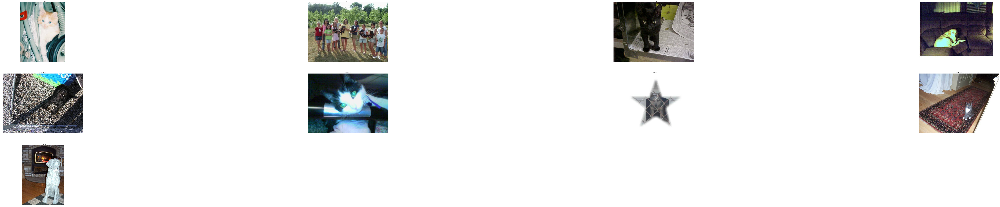

In [110]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np

plt.figure(figsize=(256, 256))
length = len(wrong_type2_list)
for i in range(length):
    img_file_name = bad_images_list[wrong_type2_list[i]]
    plt.subplot(16, 4, i+1)
    plt.title(img_file_name)
    plt.axis('off')
    img_path = "./train/" + img_file_name
    img_obj = mpimg.imread(img_path)
    plt.imshow(img_obj, interpolation="nearest")

## 展示包含卡通猫狗或者两者都有的图片

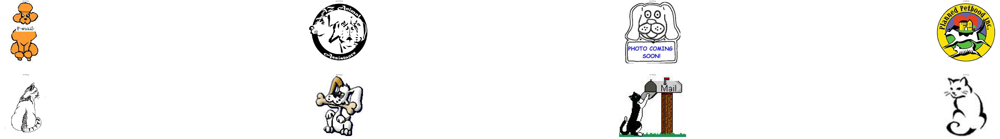

In [111]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np

plt.figure(figsize=(256, 256))
length = len(wrong_type3_list)
for i in range(length):
    img_file_name = bad_images_list[wrong_type3_list[i]]
    plt.subplot(16, 4, i+1)
    plt.title(img_file_name)
    plt.axis('off')
    img_path = "./train/" + img_file_name
    img_obj = mpimg.imread(img_path)
    plt.imshow(img_obj, interpolation="nearest")

## 展示背景复杂但是包含正常猫狗单一图片

In [112]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np

plt.figure(figsize=(256, 256))
length = len(wrong_type4_list)
for i in range(length):
    img_file_name = bad_images_list[wrong_type4_list[i]]
    plt.subplot(16, 4, i+1)
    plt.title(img_file_name)
    plt.axis('off')
    img_path = "./train/" + img_file_name
    img_obj = mpimg.imread(img_path)
    plt.imshow(img_obj, interpolation="nearest")

In [115]:
len(wrong_type1_list) + len(wrong_type2_list) + len(wrong_type3_list) + len(wrong_type4_list)

64